In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import xarray as xr                      
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import glob
from datetime import date, time, datetime 
import pandas as pd 
import netCDF4 as net
from netCDF4 import num2date
import scipy.io
from scipy.io import loadmat
from scipy import interpolate
import datetime as dt
import math

In [2]:
model = scipy.io.loadmat('Routine_v020721.mat')
alongtrack = xr.open_dataset('/Users/emmagurcan/Documents/JPL_2021/along-track data/Sentinel3A_NRT_2019_2020.nc')

In [3]:
# Function to convert datenum to datetime
def matlab2datetime(matlab_datenum):
    day = dt.datetime.fromordinal(int(matlab_datenum))
    dayfrac = dt.timedelta(days=int(matlab_datenum%1)) - dt.timedelta(days = 366)
    return day + dayfrac

In [4]:
# Function to find index of specific date. times is the array of times in matlab
def time_idx(year, month, day, times):
    idx = -1
    for time in times:
        idx += 1
        if matlab2datetime(time) == datetime(year, month, day):
            return idx

In [5]:
# Function that plots model data at a given date
def plot_model_at_date(dataset, year, month, day):
    # Determine data to plot
    adt = dataset['adt2']
    times = dataset['t'] 
    idx = time_idx(year, month, day, times)
    plot_data = adt[:, :, idx]
    
    # Determine parameters
    lon = dataset['lon']
    lat = dataset['lat']
    x_min = np.min(lon)
    x_max = np.max(lon)
    y_min = np.min(lat)
    y_max = np.max(lat)
    
    # Create figure
    fig = plt.figure(figsize = (20, 5), dpi = 80)
    ax = fig.add_subplot(projection=ccrs.PlateCarree())
    ax.set_extent([x_min, x_max, y_min, y_max], crs = ccrs.PlateCarree())
    
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                   linewidth=.5, color='gray', alpha=0.5, linestyle='--') # include gridlines on map
    gl.top_labels = False     # don't want to plot labels on top side
    gl.right_labels = False 
    f = ax.pcolormesh(lon, lat, plot_data, cmap = 'coolwarm', vmin = 0.4, vmax = 0.9)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE) 
    
    # Colorbar
    fig.colorbar(f)
    
    # Title
    title = "Absolute Dynamic Topograph (in meters) from Model on {year}-{month}-{day}"
    ax.set_title(title.format(year = int(year), month = int(month), day = int(day)))
    
    plt.show()

/Users/emmagurcan/opt/anaconda3/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1702: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


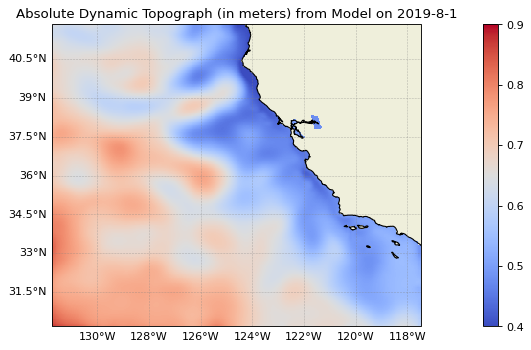

In [6]:
plot_model_at_date(model, 2019, 8, 1)

In [7]:
# plots alongtrack data given alongtrack dataset and specific desired data
def plot_alongtrack_data(dataset, data, title):
    #determine the long and lat
    long = dataset['longitude']
    lat = dataset['latitude']
    
    # determine coordinates
    attributes = dataset.attrs
    x_min = attributes['longitude_min']
    x_max = attributes['longitude_max']
    y_min = attributes['latitude_min']
    y_max = attributes['latitude_max']
    
    # set figure axis
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree()) # define the map projection
    ax.set_extent([x_min, x_max, y_min, y_max], crs=ccrs.PlateCarree())
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                   linewidth=.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False 
    
    # plot data
    plt.scatter(long, lat, c=data, s=3, cmap = 'coolwarm')
    
    # coastlines
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)
    
    #colorbar
    plt.colorbar(shrink = 0.5)
    
    # set title
    plt.title(title)
    
    plt.show()

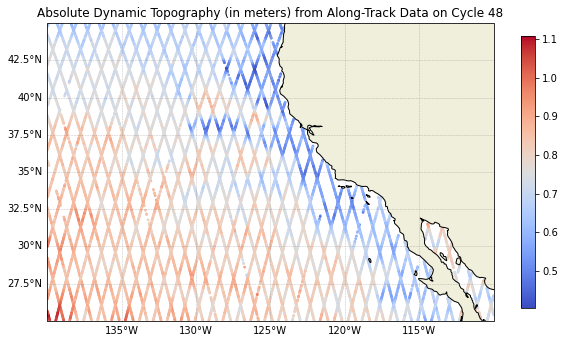

In [15]:
#ground tracks plot
alongtrack_adt = alongtrack['adt']
alongtrack_lon = alongtrack['longitude']
alongtrack_lat = alongtrack['latitude']
adt_day_1 = alongtrack_adt[1, :, :]
title = 'Absolute Dynamic Topography (in meters) from Along-Track Data on Cycle 48'

plot_alongtrack_data(alongtrack, adt_day_1, title)

In [9]:
# INTERPOLATION

In [10]:
def find_val(a_list, given_value):
    absolute_difference_function = lambda list_value : abs(list_value - given_value)

    closest_value = min(a_list, key=absolute_difference_function)

    return closest_value

In [11]:
# interpolates model dataset to alongtrack data at a given date
def interpolation_plot_at_date(model, alongtrack, year, month, day):
    # extract variables from the dataset
    alongtrack_adt = alongtrack['adt']
    alongtrack_lon = alongtrack['longitude']
    alongtrack_lat = alongtrack['latitude']
    alongtrack_time = alongtrack['time']

    model_lon = model['lon']
    model_lat = model['lat']
    model_adt = model['adt2']
    model_time = model['t']
    
    alon = alongtrack_lon.values
    alat = alongtrack_lat.values
    
    # determine desired time index
    idx = time_idx(year, month, day, model_time)
    
    x = model_lon
    y = model_lat
    t = model_time[idx]
    z = model_adt[:, :, idx]
    
    # slice alongtrack data to fit model data's coordinate restrictions
    x_new = np.ndarray(shape=(342,72))
    y_new= np.ndarray(shape=(342,72))
    x_new[:] = np.NaN
    y_new[:] = np.NaN
        
    ix = 0
    c = 0
    for jy in range(len(alon[0,:])):
        while ix < len(alon):
            if alon[ix,jy] <= (np.max(model_lon)) and alon[ix,jy] >= (np.min(model_lon)) and alat[ix,jy] <= (np.max(model_lat)) and alat[ix,jy] >= (np.min(model_lat)):
                x_new[c,jy] = alon[ix,jy]
                y_new[c,jy] = alat[ix,jy]
                c += 1
            ix += 1
        c = 0
        ix = 0
    

    # modify x_new and y_new such that they do not contain NaN
    t_new = model_time[idx]
    znew = np.empty(np.shape(z)); znew = np.NaN
    
    # interpolate the model data to the alongtrack
    # x and y form a regular grid - define them in one dimension
    d = (x[:,0],y[0,:])
    ints = interpolate.RegularGridInterpolator(d, z)
    # only input data where there are no NaNs
    znew = ints((x_new[~np.isnan(x_new)], y_new[~np.isnan(y_new)]))
    
     # Create figure
    fig = plt.figure(figsize = (6, 6), dpi = 80)
    ax = fig.add_subplot(projection=ccrs.PlateCarree())

    ax.set_extent([np.min(x_new[~np.isnan(x_new)]), np.max(x_new[~np.isnan(x_new)]), np.min(y_new[~np.isnan(y_new)]), np.max(y_new[~np.isnan(y_new)])], crs = ccrs.PlateCarree())
    
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                   linewidth=.5, color='gray', alpha=0.5, linestyle='--') # include gridlines on map
    gl.top_labels = False     # don't want to plot labels on top side
    gl.right_labels = False 
    f = ax.scatter(x_new[~np.isnan(x_new)], y_new[~np.isnan(y_new)], c = znew, s = 5, cmap = 'coolwarm', vmin = 0.4, vmax = 0.9)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE) 
    
     # Colorbar
    fig.colorbar(f, shrink=0.5)
    
    # Title
    title = "Interpolated Absolute Dynamic Topography (in meters) from Model on {year}-{month}-{day}"
    ax.set_title(title.format(year = int(year), month = int(month), day = int(day)))
    
    plt.show()   

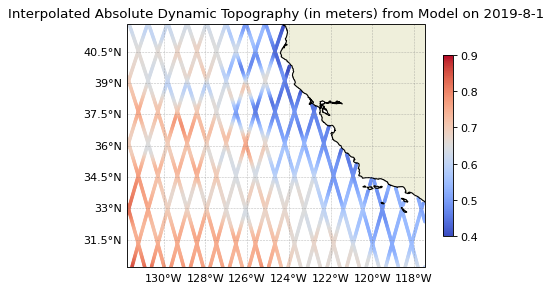

In [12]:
interpolation_plot_at_date(model, alongtrack, 2019, 8, 1)

In [13]:
# interpolates the model dataset to the alongtrack data at all times in the model dataset
def interpolation_plot_all_times(model, alongtrack):
    # extract variables from the dataset
    alongtrack_adt = alongtrack['adt']
    alongtrack_lon = alongtrack['longitude']
    alongtrack_lat = alongtrack['latitude']
    alongtrack_time = alongtrack['time']

    model_lon = model['lon']
    model_lat = model['lat']
    model_adt = model['adt2']
    model_time = model['t']
    
    alon = alongtrack_lon.values
    alat = alongtrack_lat.values
    
    x_new = np.ndarray(shape=(342,72))
    y_new= np.ndarray(shape=(342,72))
    x_new[:] = np.NaN
    y_new[:] = np.NaN
    
    # instead of a loop, you can give the function the time the observation was taken --> ind
    for idx in range(len(model_time)):
        x = model_lon
        y = model_lat
        t = model_time[idx]
        z = model_adt[:, :, idx]
        
        date = matlab2datetime(t)
        

        # slice alongtrack data to fit model data's coordinate restrictions
        ix = 0
        jy = 25
        c = 0
        for jy in range(len(alon[0,:])):
            while ix < len(alon):
                if alon[ix,jy] <= (np.max(model_lon)) and alon[ix,jy] >= (np.min(model_lon)) and alat[ix,jy] <= (np.max(model_lat)) and alat[ix,jy] >= (np.min(model_lat)):
                    x_new[c,jy] = alon[ix,jy]
                    y_new[c,jy] = alat[ix,jy]
                    c += 1
                ix += 1
            c = 0
            ix = 0

        # modify x_new and y_new such that they do not contain NaN
        t_new = model_time[idx]
        znew = np.empty(np.shape(z)); znew = np.NaN
        
        # append the the list
        
        # interpolate the model data to the alongtrack
        # x and y form a regular grid - define them in one dimension
        d = (x[:,0],y[0,:])
        ints = interpolate.RegularGridInterpolator(d, z)
        # only input data where there are no NaNs
        znew = ints((x_new[~np.isnan(x_new)], y_new[~np.isnan(y_new)]))

        # Create figure
        fig = plt.figure(figsize = (20, 5), dpi = 80)
        ax = fig.add_subplot(projection=ccrs.PlateCarree())

        ax.set_extent([np.min(x_new[~np.isnan(x_new)]), np.max(x_new[~np.isnan(x_new)]), np.min(y_new[~np.isnan(y_new)]), np.max(y_new[~np.isnan(y_new)])], crs = ccrs.PlateCarree())

        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                       linewidth=.5, color='gray', alpha=0.5, linestyle='--') # include gridlines on map
        gl.top_labels = False     # don't want to plot labels on top side
        gl.right_labels = False 
        f = ax.scatter(x_new[~np.isnan(x_new)], y_new[~np.isnan(y_new)], c = znew, s=5, cmap = 'coolwarm', vmin = 0.4, vmax = 0.9)
        ax.add_feature(cfeature.LAND)
        ax.add_feature(cfeature.COASTLINE) 

        # Colorbar
        fig.colorbar(f)

        # Title
        title = "Interpolated Absolute Dynamic Topography (in meters) from Model on {matlabdate}"
        ax.set_title(title.format(matlabdate = date))

        plt.show()

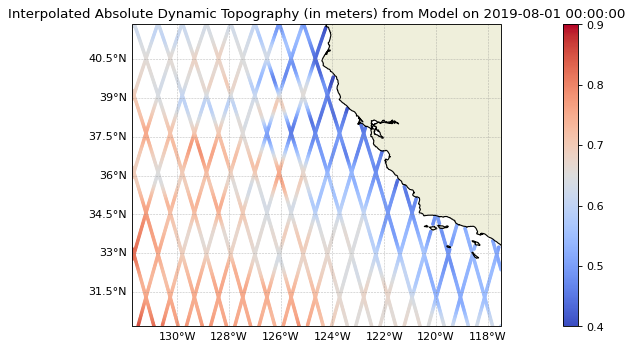

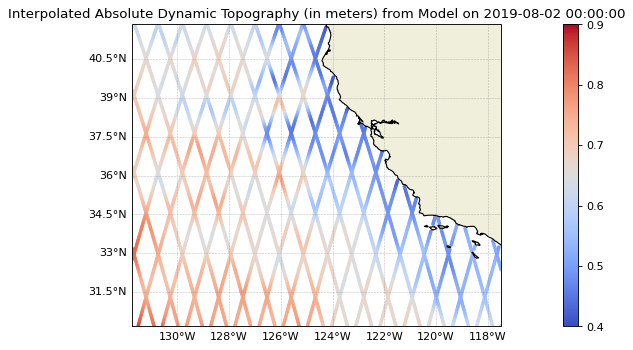

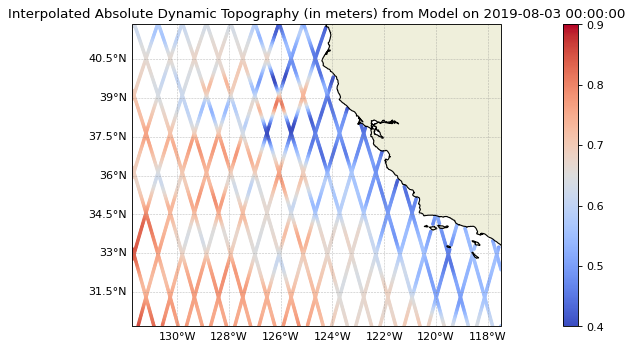

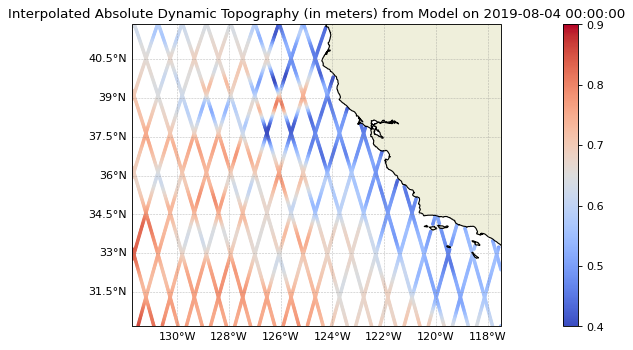

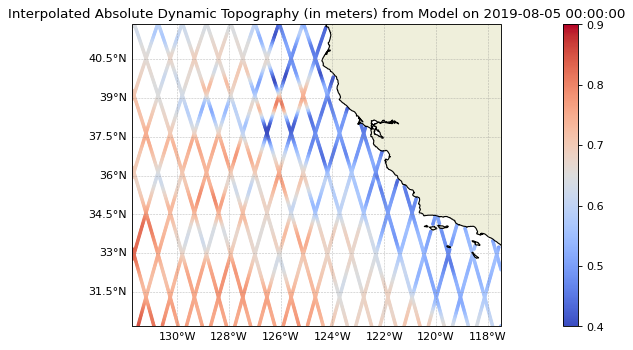

...

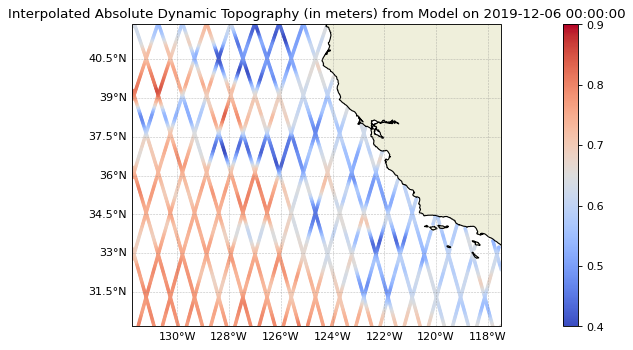

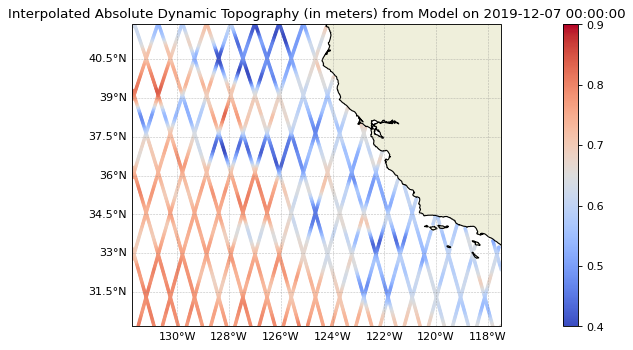

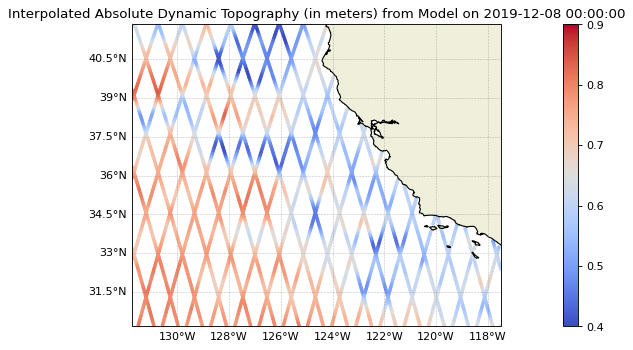

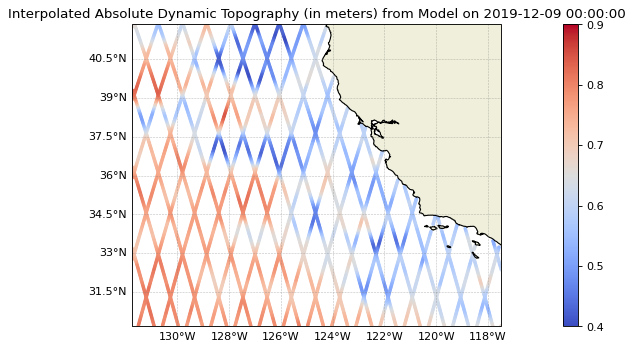

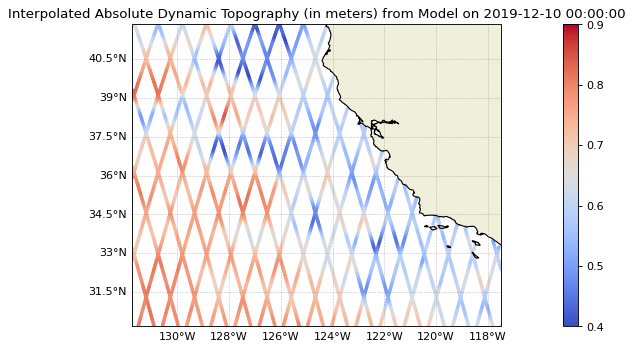

In [14]:
interpolation_plot_all_times(model,alongtrack)